# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

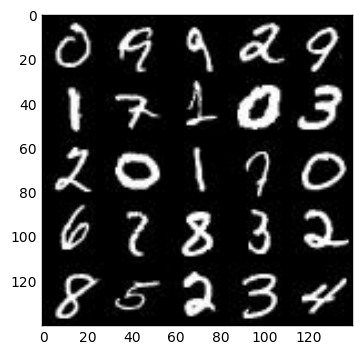

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

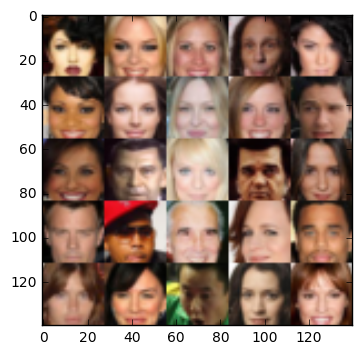

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels))
    input_z = tf.placeholder(tf.float32, (None, z_dim), name="z_dim")
    lr = tf.placeholder(tf.float32)
    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer 28x28xn
        x1 = tf.layers.conv2d(images, 32, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(0.2*x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 64, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(0.2*bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 128, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(0.2*bn3, bn3)
        # 4x4x256
        
        # Flatten
        flat = tf.reshape(relu3, (-1, 4*4*128))
        logits = tf.layers.dense(flat, 1,kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.sigmoid(logits)
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse = False
    if is_train == True:
        reuse = False
    else:
        reuse = True
        
    with tf.variable_scope('generator',reuse=reuse):
        # fully connected layer
        x1 = tf.layers.dense(z, 3*3*256,kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        # reshape
        x1 = tf.reshape(x1, (-1, 3, 3, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2*x1, x1)
        #3x3x256
        
        x2 = tf.layers.conv2d_transpose(x1,128,5,strides=1,padding='valid',
                                        kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2*x2, x2)
        # 7x7x128
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same',
                                        kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2*x3, x3)
        # 14x14x128
        
        # output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same',
                                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28x28x3
        
        out = tf.tanh(logits)
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*0.9))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                                         labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim,is_train=False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
        
#     tf.reset_default_graph()
    input_real, input_z, lr = model_inputs(data_shape[1],data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    saver = tf.train.Saver()
#     samples, losses = [], []
    step = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                step += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images*2
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, lr:learning_rate})
                
                if step % 50 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
#                     losses.append((train_loss_d, train_loss_g))
                    
                if step % 300 == 0:
                    show_generator_output(sess,16,input_z,data_shape[3], data_image_mode)
        show_generator_output(sess,16,input_z,data_shape[3], data_image_mode)
            
        saver.save(sess, './checkpoints/generator.ckpt')
        
            
#         return losses, samples

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

(60000, 28, 28, 1)
Epoch 1/2... Discriminator Loss: 0.4756... Generator Loss: 3.9076
Epoch 1/2... Discriminator Loss: 0.6982... Generator Loss: 2.3540
Epoch 1/2... Discriminator Loss: 1.3648... Generator Loss: 0.8385
Epoch 1/2... Discriminator Loss: 0.7879... Generator Loss: 1.3778
Epoch 1/2... Discriminator Loss: 0.6952... Generator Loss: 1.8132
Epoch 1/2... Discriminator Loss: 0.9910... Generator Loss: 1.1363


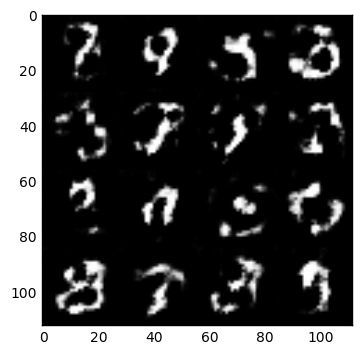

Epoch 1/2... Discriminator Loss: 0.8796... Generator Loss: 1.2976
Epoch 1/2... Discriminator Loss: 1.0244... Generator Loss: 1.2194
Epoch 1/2... Discriminator Loss: 1.0367... Generator Loss: 1.4121
Epoch 1/2... Discriminator Loss: 1.0589... Generator Loss: 1.1614
Epoch 1/2... Discriminator Loss: 1.1122... Generator Loss: 1.4573
Epoch 1/2... Discriminator Loss: 1.1289... Generator Loss: 1.5519


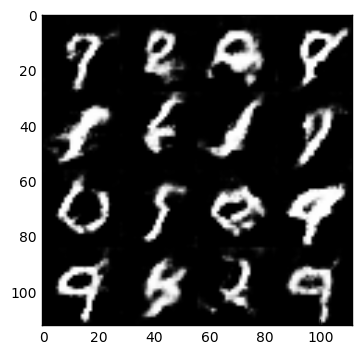

Epoch 1/2... Discriminator Loss: 1.2275... Generator Loss: 0.7200
Epoch 1/2... Discriminator Loss: 1.0634... Generator Loss: 1.2424
Epoch 1/2... Discriminator Loss: 1.0357... Generator Loss: 0.9870
Epoch 1/2... Discriminator Loss: 1.1187... Generator Loss: 1.0087
Epoch 1/2... Discriminator Loss: 1.1199... Generator Loss: 1.2574
Epoch 1/2... Discriminator Loss: 1.0261... Generator Loss: 1.1515


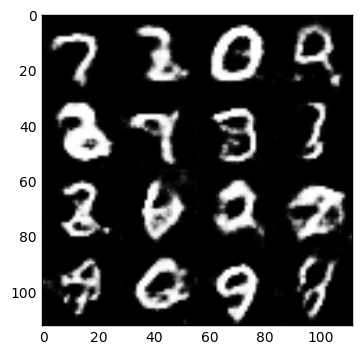

Epoch 2/2... Discriminator Loss: 1.1597... Generator Loss: 1.6354
Epoch 2/2... Discriminator Loss: 1.0311... Generator Loss: 0.9502
Epoch 2/2... Discriminator Loss: 1.3995... Generator Loss: 0.5354
Epoch 2/2... Discriminator Loss: 1.0894... Generator Loss: 0.8208
Epoch 2/2... Discriminator Loss: 1.0332... Generator Loss: 0.8854
Epoch 2/2... Discriminator Loss: 1.0461... Generator Loss: 0.8759


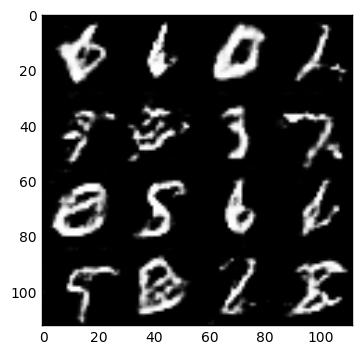

Epoch 2/2... Discriminator Loss: 1.0563... Generator Loss: 0.9000
Epoch 2/2... Discriminator Loss: 0.8948... Generator Loss: 1.5568
Epoch 2/2... Discriminator Loss: 1.4298... Generator Loss: 2.1260
Epoch 2/2... Discriminator Loss: 1.1985... Generator Loss: 0.6807
Epoch 2/2... Discriminator Loss: 0.8597... Generator Loss: 1.3373
Epoch 2/2... Discriminator Loss: 0.9704... Generator Loss: 1.0052


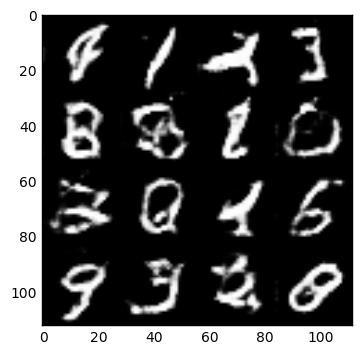

Epoch 2/2... Discriminator Loss: 1.0794... Generator Loss: 0.8583
Epoch 2/2... Discriminator Loss: 1.0061... Generator Loss: 1.1974
Epoch 2/2... Discriminator Loss: 1.1409... Generator Loss: 0.7340
Epoch 2/2... Discriminator Loss: 0.9536... Generator Loss: 1.0390
Epoch 2/2... Discriminator Loss: 0.8465... Generator Loss: 1.7784
Epoch 2/2... Discriminator Loss: 0.8381... Generator Loss: 1.0938


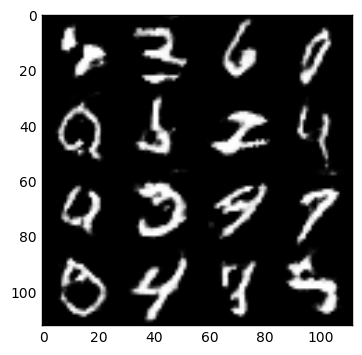

Epoch 2/2... Discriminator Loss: 0.9968... Generator Loss: 1.4455


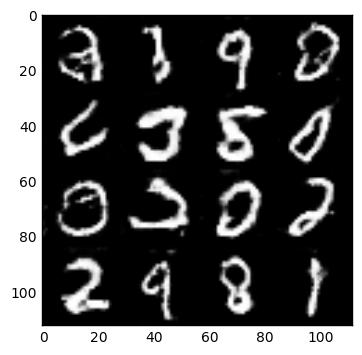

In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
print(mnist_dataset.shape)
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/1... Discriminator Loss: 0.7059... Generator Loss: 1.4158
Epoch 1/1... Discriminator Loss: 0.5098... Generator Loss: 2.5543
Epoch 1/1... Discriminator Loss: 0.4982... Generator Loss: 2.6031
Epoch 1/1... Discriminator Loss: 0.4659... Generator Loss: 3.0076
Epoch 1/1... Discriminator Loss: 0.4812... Generator Loss: 2.7670
Epoch 1/1... Discriminator Loss: 0.5229... Generator Loss: 2.8890


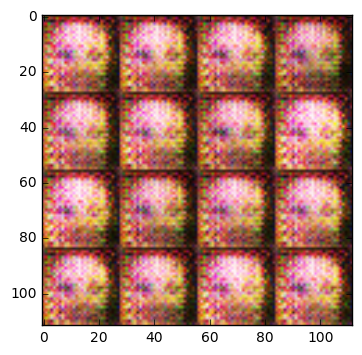

Epoch 1/1... Discriminator Loss: 0.5943... Generator Loss: 2.2517
Epoch 1/1... Discriminator Loss: 0.6394... Generator Loss: 2.4698
Epoch 1/1... Discriminator Loss: 0.5608... Generator Loss: 1.9910
Epoch 1/1... Discriminator Loss: 0.7192... Generator Loss: 1.6829
Epoch 1/1... Discriminator Loss: 0.7483... Generator Loss: 2.1379
Epoch 1/1... Discriminator Loss: 0.6886... Generator Loss: 2.0443


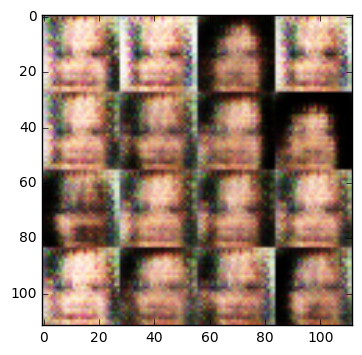

Epoch 1/1... Discriminator Loss: 1.4007... Generator Loss: 0.5891
Epoch 1/1... Discriminator Loss: 0.7657... Generator Loss: 1.4506
Epoch 1/1... Discriminator Loss: 0.8878... Generator Loss: 1.5592
Epoch 1/1... Discriminator Loss: 0.8318... Generator Loss: 1.3616
Epoch 1/1... Discriminator Loss: 0.9439... Generator Loss: 1.3981
Epoch 1/1... Discriminator Loss: 0.9980... Generator Loss: 1.0366


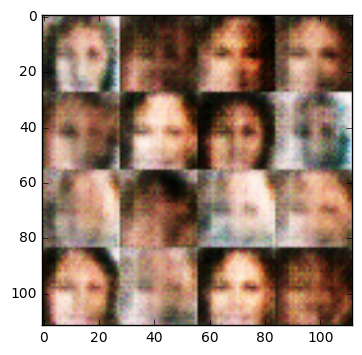

Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 0.8585... Generator Loss: 1.2238
Epoch 1/1... Discriminator Loss: 1.1287... Generator Loss: 0.9267
Epoch 1/1... Discriminator Loss: 0.9115... Generator Loss: 1.2838
Epoch 1/1... Discriminator Loss: 1.1094... Generator Loss: 0.9125
Epoch 1/1... Discriminator Loss: 1.2186... Generator Loss: 1.0056


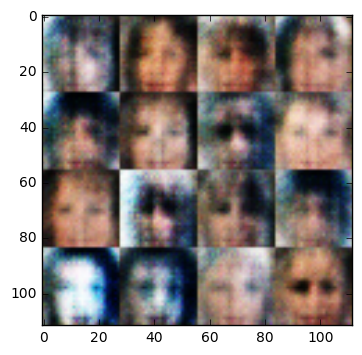

Epoch 1/1... Discriminator Loss: 1.2193... Generator Loss: 0.7039
Epoch 1/1... Discriminator Loss: 0.8527... Generator Loss: 1.2537
Epoch 1/1... Discriminator Loss: 1.1094... Generator Loss: 1.1811
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.8409
Epoch 1/1... Discriminator Loss: 1.0857... Generator Loss: 1.3564
Epoch 1/1... Discriminator Loss: 1.1055... Generator Loss: 0.9775


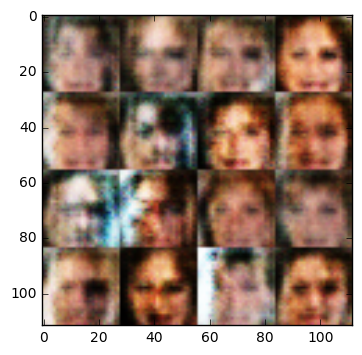

Epoch 1/1... Discriminator Loss: 1.0236... Generator Loss: 1.1376
Epoch 1/1... Discriminator Loss: 1.0838... Generator Loss: 1.0149
Epoch 1/1... Discriminator Loss: 1.1406... Generator Loss: 0.9317
Epoch 1/1... Discriminator Loss: 1.1695... Generator Loss: 0.8508
Epoch 1/1... Discriminator Loss: 1.0804... Generator Loss: 1.1118
Epoch 1/1... Discriminator Loss: 1.3436... Generator Loss: 0.9374


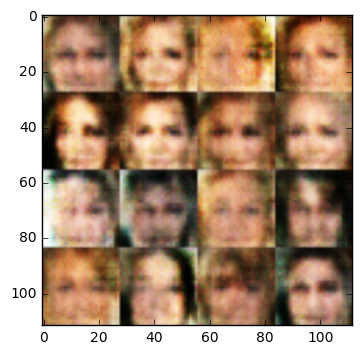

Epoch 1/1... Discriminator Loss: 1.1024... Generator Loss: 0.9340
Epoch 1/1... Discriminator Loss: 1.1828... Generator Loss: 0.9272
Epoch 1/1... Discriminator Loss: 1.0578... Generator Loss: 0.9926
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 0.9981
Epoch 1/1... Discriminator Loss: 1.4221... Generator Loss: 0.6867
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.8681


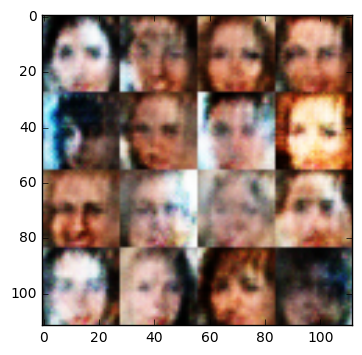

Epoch 1/1... Discriminator Loss: 1.3178... Generator Loss: 0.7986
Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.8132
Epoch 1/1... Discriminator Loss: 1.0606... Generator Loss: 1.0346
Epoch 1/1... Discriminator Loss: 1.1693... Generator Loss: 0.9780
Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 0.8642
Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.7172


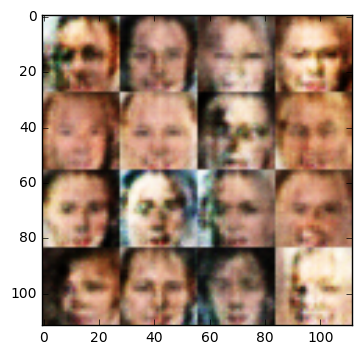

Epoch 1/1... Discriminator Loss: 1.1947... Generator Loss: 1.0986
Epoch 1/1... Discriminator Loss: 1.1559... Generator Loss: 0.8483
Epoch 1/1... Discriminator Loss: 1.1274... Generator Loss: 0.9284
Epoch 1/1... Discriminator Loss: 1.1941... Generator Loss: 1.0287
Epoch 1/1... Discriminator Loss: 0.9471... Generator Loss: 1.2033
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 0.8776


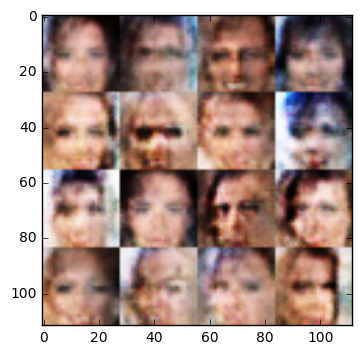

Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.8397
Epoch 1/1... Discriminator Loss: 1.4121... Generator Loss: 0.7852
Epoch 1/1... Discriminator Loss: 1.0909... Generator Loss: 1.0195
Epoch 1/1... Discriminator Loss: 1.1343... Generator Loss: 1.0580
Epoch 1/1... Discriminator Loss: 1.0022... Generator Loss: 1.1127
Epoch 1/1... Discriminator Loss: 1.2722... Generator Loss: 0.8020


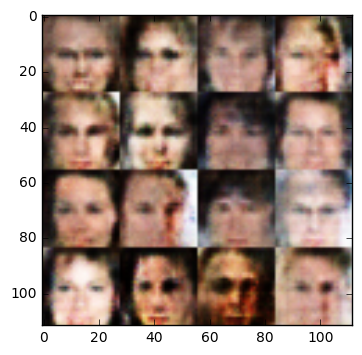

Epoch 1/1... Discriminator Loss: 1.2461... Generator Loss: 0.9056
Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 1.1180
Epoch 1/1... Discriminator Loss: 1.1395... Generator Loss: 0.9016
Epoch 1/1... Discriminator Loss: 1.1467... Generator Loss: 0.8843
Epoch 1/1... Discriminator Loss: 1.2573... Generator Loss: 0.7429
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 0.8865


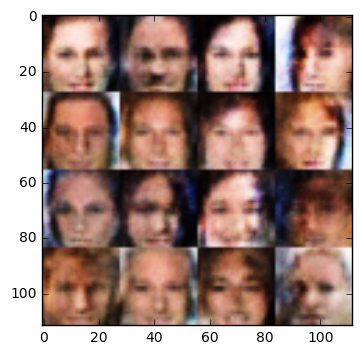

Epoch 1/1... Discriminator Loss: 1.2076... Generator Loss: 0.8512
Epoch 1/1... Discriminator Loss: 1.0759... Generator Loss: 1.0655
Epoch 1/1... Discriminator Loss: 1.3040... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 1.3227... Generator Loss: 0.7902
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.7022
Epoch 1/1... Discriminator Loss: 1.1711... Generator Loss: 0.8954


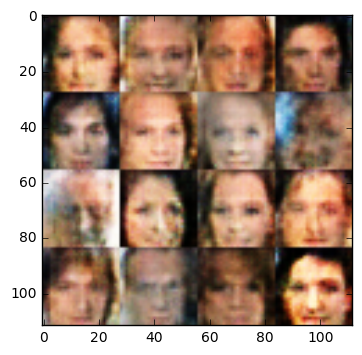

Epoch 1/1... Discriminator Loss: 1.0188... Generator Loss: 1.0899
Epoch 1/1... Discriminator Loss: 1.1539... Generator Loss: 1.0036
Epoch 1/1... Discriminator Loss: 1.1009... Generator Loss: 0.8898
Epoch 1/1... Discriminator Loss: 1.1648... Generator Loss: 0.9737
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.2430... Generator Loss: 0.8969


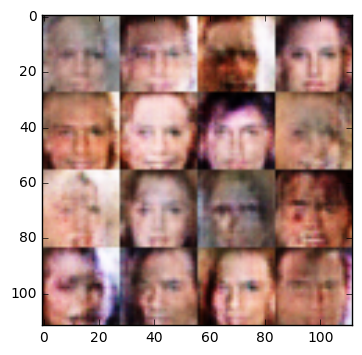

Epoch 1/1... Discriminator Loss: 1.3200... Generator Loss: 0.7816
Epoch 1/1... Discriminator Loss: 1.4822... Generator Loss: 0.6462
Epoch 1/1... Discriminator Loss: 1.1633... Generator Loss: 0.9306
Epoch 1/1... Discriminator Loss: 1.2389... Generator Loss: 0.8417
Epoch 1/1... Discriminator Loss: 0.9913... Generator Loss: 1.1442
Epoch 1/1... Discriminator Loss: 1.1748... Generator Loss: 1.0424


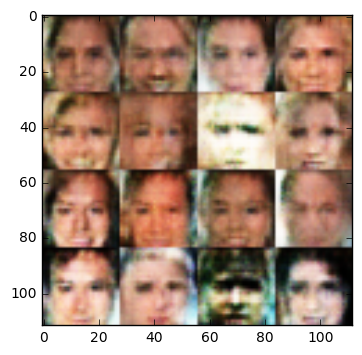

Epoch 1/1... Discriminator Loss: 0.9972... Generator Loss: 1.0978
Epoch 1/1... Discriminator Loss: 1.2396... Generator Loss: 0.8440
Epoch 1/1... Discriminator Loss: 1.2021... Generator Loss: 0.7856
Epoch 1/1... Discriminator Loss: 1.3650... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.1903... Generator Loss: 0.9462
Epoch 1/1... Discriminator Loss: 1.0594... Generator Loss: 1.0020


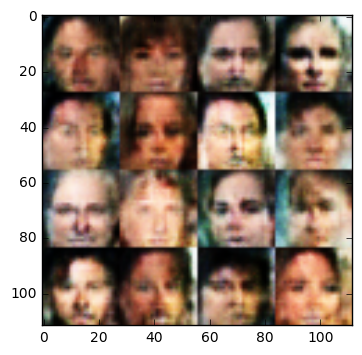

Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.7852
Epoch 1/1... Discriminator Loss: 1.0110... Generator Loss: 1.1567
Epoch 1/1... Discriminator Loss: 1.2758... Generator Loss: 0.8170
Epoch 1/1... Discriminator Loss: 0.9372... Generator Loss: 1.1412
Epoch 1/1... Discriminator Loss: 0.9578... Generator Loss: 0.9780
Epoch 1/1... Discriminator Loss: 1.1911... Generator Loss: 0.9645


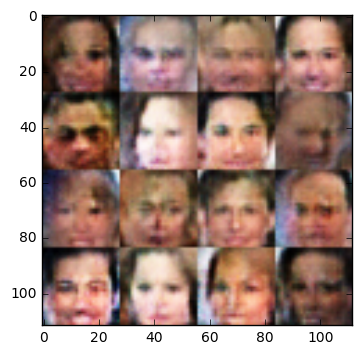

Epoch 1/1... Discriminator Loss: 1.1544... Generator Loss: 0.8834
Epoch 1/1... Discriminator Loss: 1.1108... Generator Loss: 1.0188
Epoch 1/1... Discriminator Loss: 1.1585... Generator Loss: 0.9653
Epoch 1/1... Discriminator Loss: 1.0274... Generator Loss: 0.9781
Epoch 1/1... Discriminator Loss: 1.1855... Generator Loss: 0.9360
Epoch 1/1... Discriminator Loss: 1.1248... Generator Loss: 1.0955


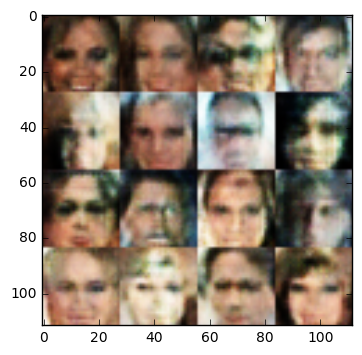

Epoch 1/1... Discriminator Loss: 1.4563... Generator Loss: 0.6827
Epoch 1/1... Discriminator Loss: 1.1183... Generator Loss: 1.0395
Epoch 1/1... Discriminator Loss: 1.1570... Generator Loss: 0.7676
Epoch 1/1... Discriminator Loss: 1.1649... Generator Loss: 0.8785
Epoch 1/1... Discriminator Loss: 1.1060... Generator Loss: 0.9562
Epoch 1/1... Discriminator Loss: 1.2281... Generator Loss: 0.7213


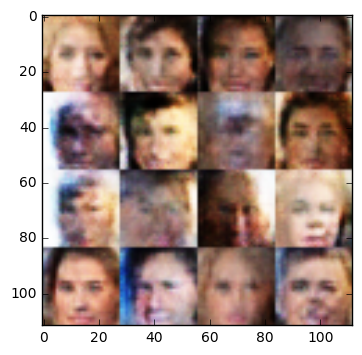

Epoch 1/1... Discriminator Loss: 1.0261... Generator Loss: 1.0439
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.2345... Generator Loss: 0.8777
Epoch 1/1... Discriminator Loss: 1.0974... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.8375
Epoch 1/1... Discriminator Loss: 1.1485... Generator Loss: 0.8126


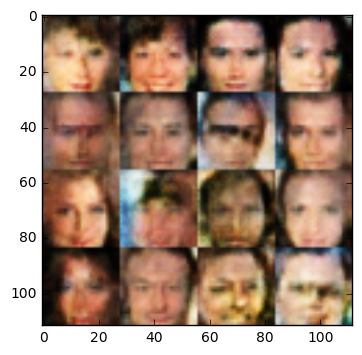

Epoch 1/1... Discriminator Loss: 1.2103... Generator Loss: 0.8980
Epoch 1/1... Discriminator Loss: 1.0325... Generator Loss: 1.0876
Epoch 1/1... Discriminator Loss: 1.0184... Generator Loss: 0.9346
Epoch 1/1... Discriminator Loss: 1.2212... Generator Loss: 0.9998
Epoch 1/1... Discriminator Loss: 1.1625... Generator Loss: 0.7668
Epoch 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.8128


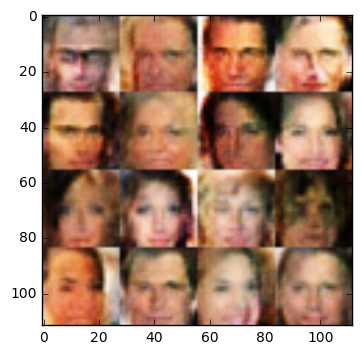

Epoch 1/1... Discriminator Loss: 1.3090... Generator Loss: 0.7327
Epoch 1/1... Discriminator Loss: 1.1090... Generator Loss: 0.9905
Epoch 1/1... Discriminator Loss: 1.2041... Generator Loss: 0.7416
Epoch 1/1... Discriminator Loss: 1.2507... Generator Loss: 0.8184
Epoch 1/1... Discriminator Loss: 1.1349... Generator Loss: 0.8181
Epoch 1/1... Discriminator Loss: 1.1162... Generator Loss: 0.8202


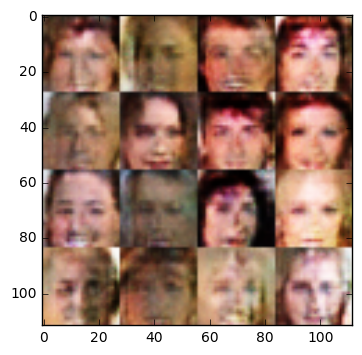

Epoch 1/1... Discriminator Loss: 1.0618... Generator Loss: 1.0465
Epoch 1/1... Discriminator Loss: 0.8743... Generator Loss: 1.2237
Epoch 1/1... Discriminator Loss: 1.2231... Generator Loss: 0.7931
Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 0.6425
Epoch 1/1... Discriminator Loss: 1.2845... Generator Loss: 0.7337
Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 0.6920


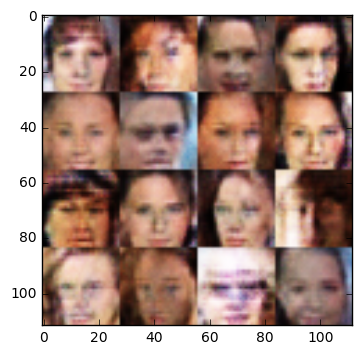

Epoch 1/1... Discriminator Loss: 1.1984... Generator Loss: 0.6504
Epoch 1/1... Discriminator Loss: 1.4382... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.3823... Generator Loss: 0.6275
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.8680
Epoch 1/1... Discriminator Loss: 1.0552... Generator Loss: 1.0265
Epoch 1/1... Discriminator Loss: 1.1907... Generator Loss: 0.7951


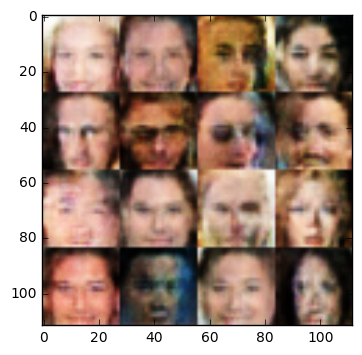

Epoch 1/1... Discriminator Loss: 1.0995... Generator Loss: 1.0161
Epoch 1/1... Discriminator Loss: 1.2843... Generator Loss: 0.7551
Epoch 1/1... Discriminator Loss: 1.1311... Generator Loss: 0.7897
Epoch 1/1... Discriminator Loss: 0.9529... Generator Loss: 1.1571
Epoch 1/1... Discriminator Loss: 1.2546... Generator Loss: 0.9136
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 0.8152


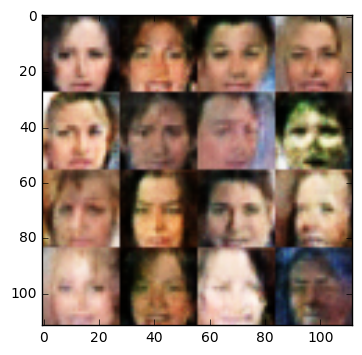

Epoch 1/1... Discriminator Loss: 1.0083... Generator Loss: 0.9555
Epoch 1/1... Discriminator Loss: 1.4555... Generator Loss: 0.5511
Epoch 1/1... Discriminator Loss: 0.9189... Generator Loss: 1.1283
Epoch 1/1... Discriminator Loss: 1.3842... Generator Loss: 0.6051
Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.6753
Epoch 1/1... Discriminator Loss: 1.1765... Generator Loss: 0.8584


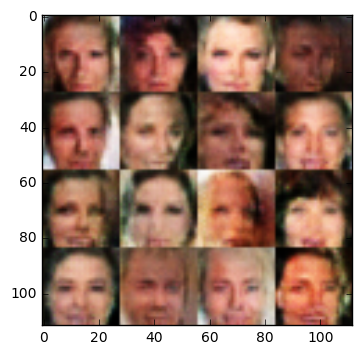

Epoch 1/1... Discriminator Loss: 1.3223... Generator Loss: 0.9126
Epoch 1/1... Discriminator Loss: 1.0652... Generator Loss: 0.8660
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 0.7987
Epoch 1/1... Discriminator Loss: 1.0053... Generator Loss: 1.1542
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.6597
Epoch 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.8272


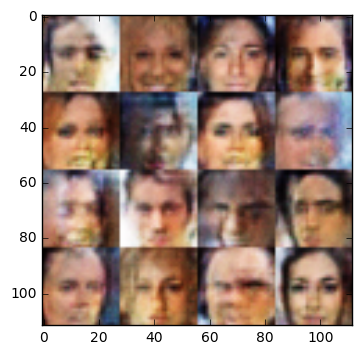

Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 0.7110
Epoch 1/1... Discriminator Loss: 1.1142... Generator Loss: 0.8645
Epoch 1/1... Discriminator Loss: 1.1922... Generator Loss: 0.7940
Epoch 1/1... Discriminator Loss: 1.1072... Generator Loss: 0.9442
Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.7578
Epoch 1/1... Discriminator Loss: 1.3390... Generator Loss: 0.8032


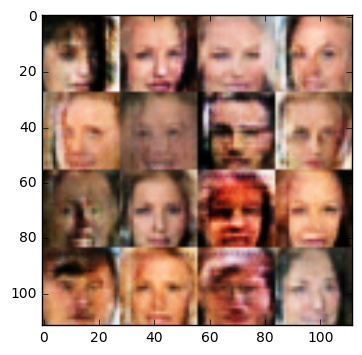

Epoch 1/1... Discriminator Loss: 1.1023... Generator Loss: 0.8760
Epoch 1/1... Discriminator Loss: 1.0547... Generator Loss: 0.8776
Epoch 1/1... Discriminator Loss: 1.0369... Generator Loss: 0.9733
Epoch 1/1... Discriminator Loss: 1.2839... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.0121... Generator Loss: 1.1115
Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 1.0777


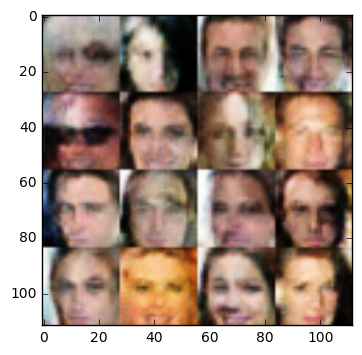

Epoch 1/1... Discriminator Loss: 0.9659... Generator Loss: 1.0576
Epoch 1/1... Discriminator Loss: 1.1342... Generator Loss: 1.0695
Epoch 1/1... Discriminator Loss: 1.2152... Generator Loss: 0.9524
Epoch 1/1... Discriminator Loss: 0.8368... Generator Loss: 1.2053
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.7053
Epoch 1/1... Discriminator Loss: 1.1777... Generator Loss: 0.8054


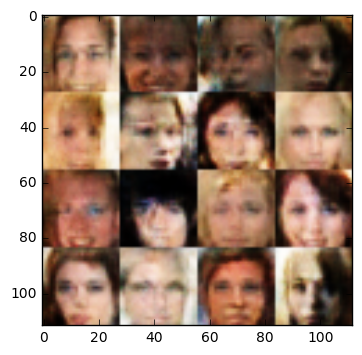

Epoch 1/1... Discriminator Loss: 1.0972... Generator Loss: 0.9452
Epoch 1/1... Discriminator Loss: 1.2551... Generator Loss: 0.7532
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.6789
Epoch 1/1... Discriminator Loss: 1.0707... Generator Loss: 1.0159
Epoch 1/1... Discriminator Loss: 1.1619... Generator Loss: 0.8690


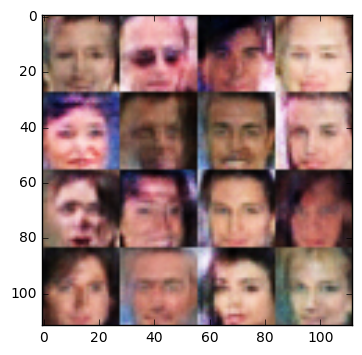

Epoch 1/1... Discriminator Loss: 1.3784... Generator Loss: 0.6383
Epoch 1/1... Discriminator Loss: 1.0427... Generator Loss: 0.9416
Epoch 1/1... Discriminator Loss: 1.3064... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 0.6704
Epoch 1/1... Discriminator Loss: 1.0432... Generator Loss: 1.0022
Epoch 1/1... Discriminator Loss: 1.2040... Generator Loss: 0.9093


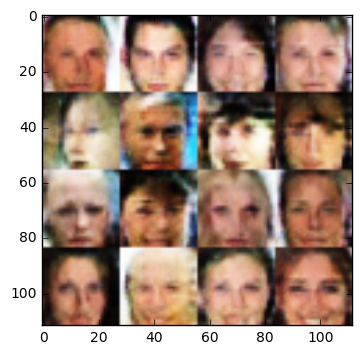

Epoch 1/1... Discriminator Loss: 1.0364... Generator Loss: 0.8789
Epoch 1/1... Discriminator Loss: 1.2628... Generator Loss: 0.9192
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.5818
Epoch 1/1... Discriminator Loss: 1.2897... Generator Loss: 0.8777
Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.8290
Epoch 1/1... Discriminator Loss: 1.0897... Generator Loss: 1.0113


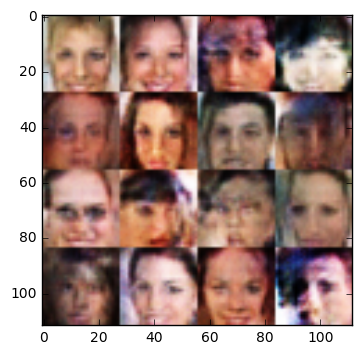

Epoch 1/1... Discriminator Loss: 1.2636... Generator Loss: 0.6801
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.6160
Epoch 1/1... Discriminator Loss: 1.1815... Generator Loss: 0.8865
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.7346
Epoch 1/1... Discriminator Loss: 1.1826... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 0.7368


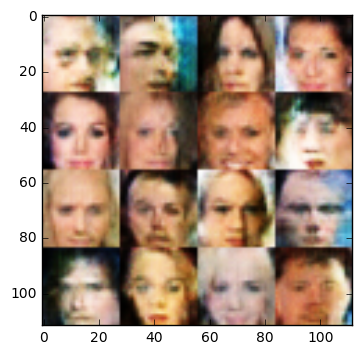

Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.7797
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 0.9693
Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 0.7340
Epoch 1/1... Discriminator Loss: 1.0900... Generator Loss: 0.9691
Epoch 1/1... Discriminator Loss: 0.8864... Generator Loss: 1.1119
Epoch 1/1... Discriminator Loss: 1.2196... Generator Loss: 0.8461


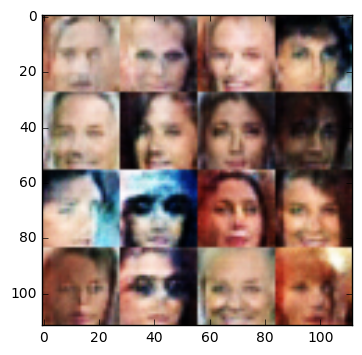

Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.8525
Epoch 1/1... Discriminator Loss: 0.9641... Generator Loss: 1.0226
Epoch 1/1... Discriminator Loss: 1.2463... Generator Loss: 0.7040
Epoch 1/1... Discriminator Loss: 1.2091... Generator Loss: 0.9323
Epoch 1/1... Discriminator Loss: 1.1341... Generator Loss: 0.8725
Epoch 1/1... Discriminator Loss: 1.4307... Generator Loss: 0.5693


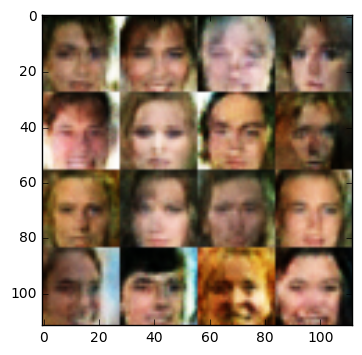

Epoch 1/1... Discriminator Loss: 1.2058... Generator Loss: 0.8173
Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 0.7247
Epoch 1/1... Discriminator Loss: 1.0857... Generator Loss: 0.9588
Epoch 1/1... Discriminator Loss: 1.3158... Generator Loss: 0.5969
Epoch 1/1... Discriminator Loss: 1.3799... Generator Loss: 0.6729
Epoch 1/1... Discriminator Loss: 1.1297... Generator Loss: 0.8281


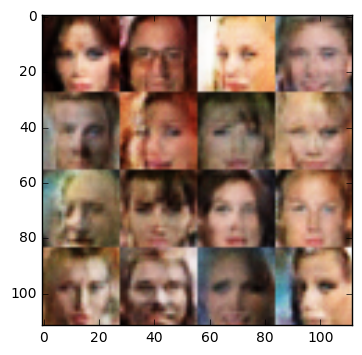

Epoch 1/1... Discriminator Loss: 1.1938... Generator Loss: 0.8248
Epoch 1/1... Discriminator Loss: 1.3393... Generator Loss: 0.8042
Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.6519
Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.8471
Epoch 1/1... Discriminator Loss: 1.0875... Generator Loss: 0.8534
Epoch 1/1... Discriminator Loss: 1.2464... Generator Loss: 0.8784


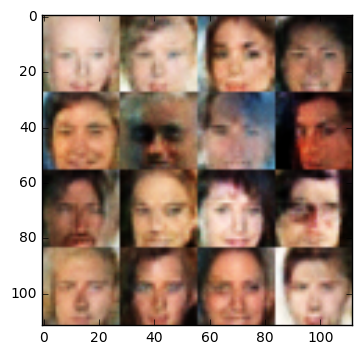

Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.9200
Epoch 1/1... Discriminator Loss: 1.2273... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.3386... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.1073... Generator Loss: 0.8668
Epoch 1/1... Discriminator Loss: 1.0171... Generator Loss: 0.7977
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.7404


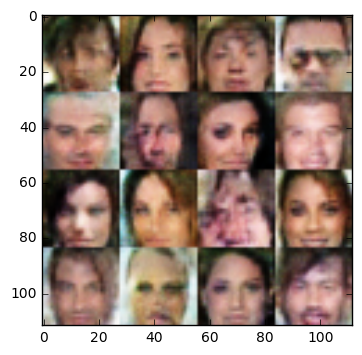

Epoch 1/1... Discriminator Loss: 1.1237... Generator Loss: 0.9699
Epoch 1/1... Discriminator Loss: 1.0937... Generator Loss: 0.8499
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 0.7222
Epoch 1/1... Discriminator Loss: 1.4449... Generator Loss: 0.8166
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.6660
Epoch 1/1... Discriminator Loss: 1.2807... Generator Loss: 0.7346


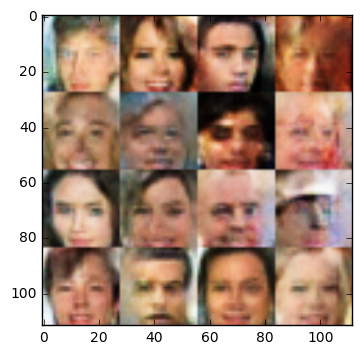

Epoch 1/1... Discriminator Loss: 1.2508... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.7664
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.6840
Epoch 1/1... Discriminator Loss: 1.1351... Generator Loss: 0.7895
Epoch 1/1... Discriminator Loss: 1.3704... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 1.0225... Generator Loss: 0.8909


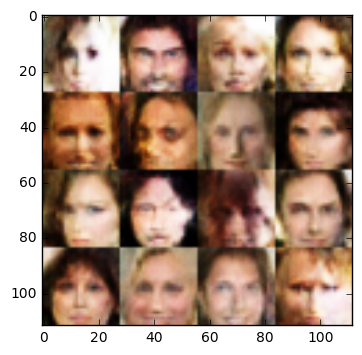

Epoch 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.8873
Epoch 1/1... Discriminator Loss: 1.2522... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 0.9264... Generator Loss: 0.9997
Epoch 1/1... Discriminator Loss: 1.0975... Generator Loss: 0.8429
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.7791
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 0.8042


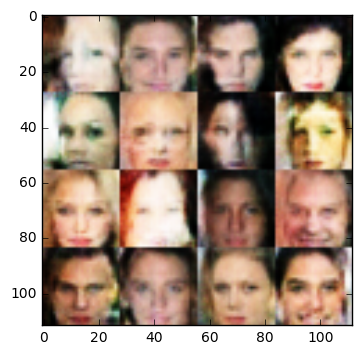

Epoch 1/1... Discriminator Loss: 1.1251... Generator Loss: 0.9006
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 0.6758
Epoch 1/1... Discriminator Loss: 1.2365... Generator Loss: 0.7906
Epoch 1/1... Discriminator Loss: 1.1639... Generator Loss: 0.7964
Epoch 1/1... Discriminator Loss: 1.2334... Generator Loss: 0.7891
Epoch 1/1... Discriminator Loss: 1.1226... Generator Loss: 0.7526


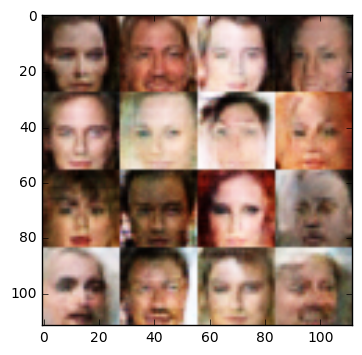

Epoch 1/1... Discriminator Loss: 1.0350... Generator Loss: 0.8988


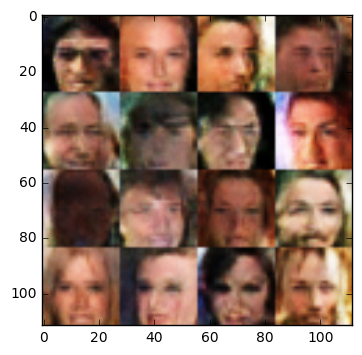

In [13]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。